In [1]:
from sklearn.metrics import make_scorer, accuracy_score #accuracy
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report #accuracy
from sklearn.model_selection import GridSearchCV #hyper parameter optimization
from sklearn.metrics import confusion_matrix #accuracy
from sklearn.metrics import accuracy_score #accuracy
from sklearn import preprocessing #EDA
import matplotlib.pylab as pylab #
import matplotlib.pyplot as plt
from pandas import get_dummies
import matplotlib as mpl
import xgboost as xgb #ML
import seaborn as sns #Plot
import pandas as pd
import numpy as np
import matplotlib
import warnings
import sklearn #ML
import scipy #EDA
import numpy  #EDA
import json #EDA
import sys  #EDA
import csv #System related variables
import os #EDA

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib as mt

In [3]:
##Reading the data
Data=pd.read_csv('Consumer_Complaints_train.csv')
copy_Data=pd.read_csv('Consumer_Complaints_train.csv')

In [87]:
Data.head()

,Sub-product,Issue,Company,State,ZIP code,Timely response?,Consumer disputed?,Received_day,Received_month,Received_year,Product_Mortage,Product_Debt_col,Product_Credit_report,Product_Credit_card,Product_Bank_acc,Product_Consumer_Loan,Product_Money_tran,Product_Payday_loan,Product_Prepaid_card,Product_Others,Product_Student_loan,Submitted_Web,Submitted_Ref,Submitted_Phone,Submitted_Postal,Submitted_Fax,Sent_day,Sent_month,Sent_year
0,199995,1735,35453,12377.0,21.0,1,No,15,5,2014,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,16,5,2014
1,2373,4618,1633,17109.0,50.0,1,No,18,9,2014,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,24,9,2014
2,199995,58527,28832,70001.0,13.0,1,No,13,3,2014,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,3,4,2014
3,199995,1735,8201,21258.0,158.0,1,No,17,7,2015,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,17,7,2015
4,199995,1624,46336,9584.0,50.0,1,No,20,11,2014,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,28,11,2014


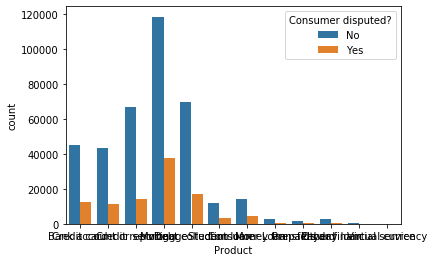

In [5]:
ax=sns.countplot(x='Product',hue='Consumer disputed?',data=Data)

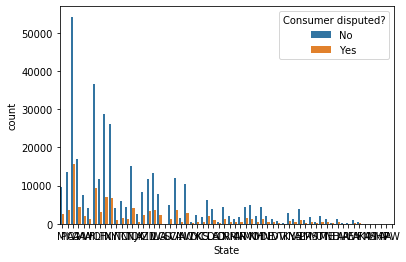

In [6]:
ax=sns.countplot(x='State',hue='Consumer disputed?',data=Data)

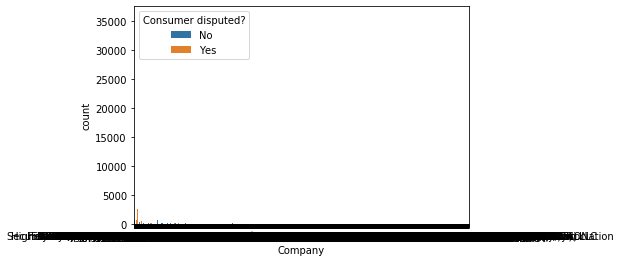

In [7]:
ax=sns.countplot(x='Company',hue='Consumer disputed?',data=Data)

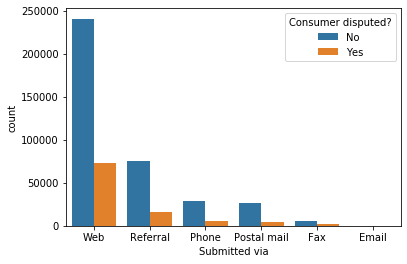

In [8]:
ax=sns.countplot(x='Submitted via',hue='Consumer disputed?',data=Data)

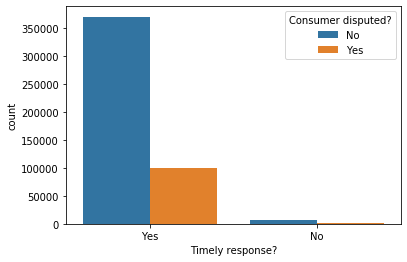

In [9]:
ax=sns.countplot(x='Timely response?',hue='Consumer disputed?',data=Data)

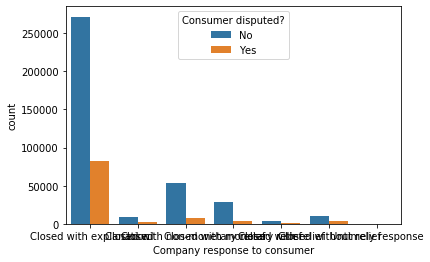

In [10]:
ax=sns.countplot(x='Company response to consumer',hue='Consumer disputed?',data=Data)

In [11]:
Data.describe()

,Complaint ID
count,4.784210e+05
mean,1.043823e+06
std,5.943613e+05
min,5.000000e+00
25%,5.338080e+05
50%,1.064723e+06
75%,1.560467e+06
max,2.128060e+06


In [12]:
Data.dtypes

Date received                   object
Product                         object
Sub-product                     object
Issue                           object
Sub-issue                       object
Consumer complaint narrative    object
Company public response         object
Company                         object
State                           object
ZIP code                        object
Tags                            object
Consumer consent provided?      object
Submitted via                   object
Date sent to company            object
Company response to consumer    object
Timely response?                object
Consumer disputed?              object
Complaint ID                     int64
dtype: object

In [13]:
Data.shape

(478421, 18)

In [14]:
Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 478421 entries, 0 to 478420
Data columns (total 18 columns):
Date received                   478421 non-null object
Product                         478421 non-null object
Sub-product                     339948 non-null object
Issue                           478421 non-null object
Sub-issue                       185796 non-null object
Consumer complaint narrative    75094 non-null object
Company public response         90392 non-null object
Company                         478421 non-null object
State                           474582 non-null object
ZIP code                        474573 non-null object
Tags                            67206 non-null object
Consumer consent provided?      135487 non-null object
Submitted via                   478421 non-null object
Date sent to company            478421 non-null object
Company response to consumer    478421 non-null object
Timely response?                478421 non-null object
Consumer dis

In [88]:
Data['Consumer complaint narrative'].unique()

KeyError: 'Consumer complaint narrative'

In [15]:
 list(zip(Data.columns,Data.dtypes,Data.nunique())) 

[('Date received', dtype('O'), 1759),
 ('Product', dtype('O'), 12),
 ('Sub-product', dtype('O'), 47),
 ('Issue', dtype('O'), 95),
 ('Sub-issue', dtype('O'), 68),
 ('Consumer complaint narrative', dtype('O'), 74019),
 ('Company public response', dtype('O'), 10),
 ('Company', dtype('O'), 3276),
 ('State', dtype('O'), 62),
 ('ZIP code', dtype('O'), 25962),
 ('Tags', dtype('O'), 3),
 ('Consumer consent provided?', dtype('O'), 4),
 ('Submitted via', dtype('O'), 6),
 ('Date sent to company', dtype('O'), 1706),
 ('Company response to consumer', dtype('O'), 7),
 ('Timely response?', dtype('O'), 2),
 ('Consumer disputed?', dtype('O'), 2),
 ('Complaint ID', dtype('int64'), 478421)]

Since all columns are object data types, need to convert them to numeric one by one.

In [16]:
Data.isnull().sum()

Date received                        0
Product                              0
Sub-product                     138473
Issue                                0
Sub-issue                       292625
Consumer complaint narrative    403327
Company public response         388029
Company                              0
State                             3839
ZIP code                          3848
Tags                            411215
Consumer consent provided?      342934
Submitted via                        0
Date sent to company                 0
Company response to consumer         0
Timely response?                     0
Consumer disputed?                   0
Complaint ID                         0
dtype: int64

In [17]:
Data

,Date received,Product,Sub-product,Issue,Sub-issue,Consumer complaint narrative,Company public response,Company,State,ZIP code,Tags,Consumer consent provided?,Submitted via,Date sent to company,Company response to consumer,Timely response?,Consumer disputed?,Complaint ID
0,2014-05-15,Credit card,NaN,Billing statement,NaN,NaN,NaN,Wells Fargo & Company,MI,48342,Older American,NaN,Web,2014-05-16,Closed with explanation,Yes,No,856103
1,2014-09-18,Bank account or service,(CD) Certificate of deposit,"Making/receiving payments, sending money",NaN,NaN,NaN,Santander Bank US,PA,18042,NaN,NaN,Referral,2014-09-24,Closed,Yes,No,1034666
2,2014-03-13,Credit reporting,NaN,Incorrect information on credit report,Account status,NaN,NaN,Equifax,CA,92427,NaN,NaN,Referral,2014-04-03,Closed with non-monetary relief,Yes,No,756363
3,2015-07-17,Credit card,NaN,Billing statement,NaN,"My credit card statement from US Bank, XXXX. X...",Company chooses not to provide a public response,U.S. Bancorp,GA,305XX,Older American,Consent provided,Web,2015-07-17,Closed with monetary relief,Yes,No,1474177
4,2014-11-20,Credit card,NaN,Transaction issue,NaN,NaN,NaN,Bank of America,MA,02127,NaN,NaN,Web,2014-11-28,Closed with explanation,Yes,No,1132572
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
478416,2015-06-30,Bank account or service,Checking account,Problems caused by my funds being low,NaN,NaN,NaN,JPMorgan Chase & Co.,TX,77008,NaN,NaN,Phone,2015-07-01,Closed with explanation,Yes,No,1445488
478417,2013-06-20,Credit card,NaN,Collection practices,NaN,NaN,NaN,Citibank,AL,36111,NaN,NaN,Phone,2013-06-21,Closed with explanation,Yes,No,438011
478418,2014-09-09,Credit reporting,NaN,Incorrect information on credit report,Information is not mine,NaN,NaN,Equifax,TX,79201,NaN,NaN,Web,2014-09-09,Closed with explanation,Yes,No,1020651
478419,2012-09-21,Mortgage,Conventional fixed mortgage,"Loan modification,collection,foreclosure",NaN,NaN,NaN,"Select Portfolio Servicing, Inc",CA,91765,NaN,NaN,Web,2012-09-24,Closed with explanation,Yes,No,157524


In [18]:
Data=Data.drop(["Sub-issue","Tags","Consumer complaint narrative","Company public response","Consumer consent provided?"],axis=1)

In [19]:
pd.set_option('display.max_rows', 50)

In [20]:
pd.set_option('display.max_columns', None)

In [21]:
Data

,Date received,Product,Sub-product,Issue,Company,State,ZIP code,Submitted via,Date sent to company,Company response to consumer,Timely response?,Consumer disputed?,Complaint ID
0,2014-05-15,Credit card,NaN,Billing statement,Wells Fargo & Company,MI,48342,Web,2014-05-16,Closed with explanation,Yes,No,856103
1,2014-09-18,Bank account or service,(CD) Certificate of deposit,"Making/receiving payments, sending money",Santander Bank US,PA,18042,Referral,2014-09-24,Closed,Yes,No,1034666
2,2014-03-13,Credit reporting,NaN,Incorrect information on credit report,Equifax,CA,92427,Referral,2014-04-03,Closed with non-monetary relief,Yes,No,756363
3,2015-07-17,Credit card,NaN,Billing statement,U.S. Bancorp,GA,305XX,Web,2015-07-17,Closed with monetary relief,Yes,No,1474177
4,2014-11-20,Credit card,NaN,Transaction issue,Bank of America,MA,02127,Web,2014-11-28,Closed with explanation,Yes,No,1132572
...,...,...,...,...,...,...,...,...,...,...,...,...,...
478416,2015-06-30,Bank account or service,Checking account,Problems caused by my funds being low,JPMorgan Chase & Co.,TX,77008,Phone,2015-07-01,Closed with explanation,Yes,No,1445488
478417,2013-06-20,Credit card,NaN,Collection practices,Citibank,AL,36111,Phone,2013-06-21,Closed with explanation,Yes,No,438011
478418,2014-09-09,Credit reporting,NaN,Incorrect information on credit report,Equifax,TX,79201,Web,2014-09-09,Closed with explanation,Yes,No,1020651
478419,2012-09-21,Mortgage,Conventional fixed mortgage,"Loan modification,collection,foreclosure","Select Portfolio Servicing, Inc",CA,91765,Web,2012-09-24,Closed with explanation,Yes,No,157524


In [22]:
Data.isnull().sum()

Date received                        0
Product                              0
Sub-product                     138473
Issue                                0
Company                              0
State                             3839
ZIP code                          3848
Submitted via                        0
Date sent to company                 0
Company response to consumer         0
Timely response?                     0
Consumer disputed?                   0
Complaint ID                         0
dtype: int64

###### Date Recieved 

In [23]:
#to find exact count of unique values
Data["Date received"].value_counts()

2015-08-27    767
2015-08-26    731
2014-06-26    697
2015-07-08    678
2015-08-12    654
             ... 
2016-09-18      6
2016-09-21      4
2016-09-22      4
2014-03-09      3
2016-09-23      1
Name: Date received, Length: 1759, dtype: int64

In [24]:
#coverting DataType obj to datetime
Data['Date received']= pd.to_datetime(Data['Date received'])

In [25]:
#seprating day month and year of Delivery_dt column and create new column
Data['Received_day'] = Data['Date received'].dt.day
Data['Received_month'] = Data['Date received'].dt.month
Data['Received_year'] = Data['Date received'].dt.year

In [26]:
Data

,Date received,Product,Sub-product,Issue,Company,State,ZIP code,Submitted via,Date sent to company,Company response to consumer,Timely response?,Consumer disputed?,Complaint ID,Received_day,Received_month,Received_year
0,2014-05-15,Credit card,NaN,Billing statement,Wells Fargo & Company,MI,48342,Web,2014-05-16,Closed with explanation,Yes,No,856103,15,5,2014
1,2014-09-18,Bank account or service,(CD) Certificate of deposit,"Making/receiving payments, sending money",Santander Bank US,PA,18042,Referral,2014-09-24,Closed,Yes,No,1034666,18,9,2014
2,2014-03-13,Credit reporting,NaN,Incorrect information on credit report,Equifax,CA,92427,Referral,2014-04-03,Closed with non-monetary relief,Yes,No,756363,13,3,2014
3,2015-07-17,Credit card,NaN,Billing statement,U.S. Bancorp,GA,305XX,Web,2015-07-17,Closed with monetary relief,Yes,No,1474177,17,7,2015
4,2014-11-20,Credit card,NaN,Transaction issue,Bank of America,MA,02127,Web,2014-11-28,Closed with explanation,Yes,No,1132572,20,11,2014
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
478416,2015-06-30,Bank account or service,Checking account,Problems caused by my funds being low,JPMorgan Chase & Co.,TX,77008,Phone,2015-07-01,Closed with explanation,Yes,No,1445488,30,6,2015
478417,2013-06-20,Credit card,NaN,Collection practices,Citibank,AL,36111,Phone,2013-06-21,Closed with explanation,Yes,No,438011,20,6,2013
478418,2014-09-09,Credit reporting,NaN,Incorrect information on credit report,Equifax,TX,79201,Web,2014-09-09,Closed with explanation,Yes,No,1020651,9,9,2014
478419,2012-09-21,Mortgage,Conventional fixed mortgage,"Loan modification,collection,foreclosure","Select Portfolio Servicing, Inc",CA,91765,Web,2012-09-24,Closed with explanation,Yes,No,157524,21,9,2012


###### Product

In [27]:
Data["Product"].value_counts()

Mortgage                   156175
Debt collection             86544
Credit reporting            81115
Credit card                 57358
Bank account or service     54403
Consumer Loan               18599
Student loan                14918
Money transfers              3349
Payday loan                  3219
Prepaid card                 2226
Other financial service       507
Virtual currency                8
Name: Product, dtype: int64

In [28]:
Data["Product_Mortage"]=np.where(Data["Product"]=="Mortage",1,0)
Data["Product_Debt_col"]=np.where(Data["Product"]=="Debt collection",1,0)
Data["Product_Credit_report"]=np.where(Data["Product"]=="Credit reporting",1,0)
Data["Product_Credit_card"]=np.where(Data["Product"]=="Credit card",1,0)
Data["Product_Bank_acc"]=np.where(Data["Product"]=="Bank account or service",1,0)
Data["Product_Consumer_Loan"]=np.where(Data["Product"]=="Consumer Loan",1,0)
Data["Product_Money_tran"]=np.where(Data["Product"]=="Money transfers",1,0)
Data["Product_Payday_loan"]=np.where(Data["Product"]=="Payday loan",1,0)
Data["Product_Prepaid_card"]=np.where(Data["Product"]=="Prepaid card",1,0)
Data["Product_Others"]=np.where(Data["Product"]=="Other financial service",1,0)
Data["Product_Student_loan"]=np.where(Data["Product"]=="Student loan",1,0)


In [29]:
Data

,Date received,Product,Sub-product,Issue,Company,State,ZIP code,Submitted via,Date sent to company,Company response to consumer,Timely response?,Consumer disputed?,Complaint ID,Received_day,Received_month,Received_year,Product_Mortage,Product_Debt_col,Product_Credit_report,Product_Credit_card,Product_Bank_acc,Product_Consumer_Loan,Product_Money_tran,Product_Payday_loan,Product_Prepaid_card,Product_Others,Product_Student_loan
0,2014-05-15,Credit card,NaN,Billing statement,Wells Fargo & Company,MI,48342,Web,2014-05-16,Closed with explanation,Yes,No,856103,15,5,2014,0,0,0,1,0,0,0,0,0,0,0
1,2014-09-18,Bank account or service,(CD) Certificate of deposit,"Making/receiving payments, sending money",Santander Bank US,PA,18042,Referral,2014-09-24,Closed,Yes,No,1034666,18,9,2014,0,0,0,0,1,0,0,0,0,0,0
2,2014-03-13,Credit reporting,NaN,Incorrect information on credit report,Equifax,CA,92427,Referral,2014-04-03,Closed with non-monetary relief,Yes,No,756363,13,3,2014,0,0,1,0,0,0,0,0,0,0,0
3,2015-07-17,Credit card,NaN,Billing statement,U.S. Bancorp,GA,305XX,Web,2015-07-17,Closed with monetary relief,Yes,No,1474177,17,7,2015,0,0,0,1,0,0,0,0,0,0,0
4,2014-11-20,Credit card,NaN,Transaction issue,Bank of America,MA,02127,Web,2014-11-28,Closed with explanation,Yes,No,1132572,20,11,2014,0,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
478416,2015-06-30,Bank account or service,Checking account,Problems caused by my funds being low,JPMorgan Chase & Co.,TX,77008,Phone,2015-07-01,Closed with explanation,Yes,No,1445488,30,6,2015,0,0,0,0,1,0,0,0,0,0,0
478417,2013-06-20,Credit card,NaN,Collection practices,Citibank,AL,36111,Phone,2013-06-21,Closed with explanation,Yes,No,438011,20,6,2013,0,0,0,1,0,0,0,0,0,0,0
478418,2014-09-09,Credit reporting,NaN,Incorrect information on credit report,Equifax,TX,79201,Web,2014-09-09,Closed with explanation,Yes,No,1020651,9,9,2014,0,0,1,0,0,0,0,0,0,0,0
478419,2012-09-21,Mortgage,Conventional fixed mortgage,"Loan modification,collection,foreclosure","Select Portfolio Servicing, Inc",CA,91765,Web,2012-09-24,Closed with explanation,Yes,No,157524,21,9,2012,0,0,0,0,0,0,0,0,0,0,0


In [30]:
Data['Sub-product'].isnull().sum()

138473

In [31]:
Data["Sub-product"]=Data['Sub-product'].fillna("Other mortgage")

In [32]:
Data['Sub-product'].isnull().sum()

0

In [33]:
#to find exact count of unique values
Sub_product=Data['Sub-product'].value_counts()
Sub_product

Other mortgage                            199995
Conventional fixed mortgage                48028
Checking account                           38310
Other (i.e. phone, health club, etc.)      25691
I do not know                              18169
Credit card                                17981
Conventional adjustable mortgage (ARM)     17566
FHA mortgage                               16316
Non-federal student loan                   15287
Medical                                    11514
Vehicle loan                               10714
Other bank product/service                  9896
Payday loan                                 7837
Home equity loan or line of credit          7605
Installment loan                            4788
Savings account                             3419
VA mortgage                                 3285
Mortgage                                    3033
(CD) Certificate of deposit                 2373
Auto                                        2167
International money 

In [34]:
df_frequency_map=Data["Sub-product"].value_counts().to_dict()

In [35]:
Data["Sub-product"] = Data["Sub-product"].map(df_frequency_map)

In [36]:
Data.shape

(478421, 27)

In [37]:
var=Data['Issue'].unique()
var


array(['Billing statement', 'Making/receiving payments, sending money',
       'Incorrect information on credit report', 'Transaction issue',
       'Loan modification,collection,foreclosure',
       'Loan servicing, payments, escrow account',
       'Credit card protection / Debt protection',
       'Deposits and withdrawals',
       "Cont'd attempts collect debt not owed", 'Getting a loan', 'Other',
       'Account opening, closing, or management',
       "Credit reporting company's investigation",
       'Improper use of my credit report', 'Managing the loan or lease',
       'Communication tactics', 'False statements or representation',
       'Dealing with my lender or servicer',
       'Problems caused by my funds being low', 'Delinquent account',
       'Identity theft / Fraud / Embezzlement',
       'Other transaction issues', 'Disclosure verification of debt',
       'Balance transfer fee', 'Using a debit or ATM card',
       'Improper contact or sharing of info',
       'Appl

In [38]:
Data['Issue'].value_counts()

Loan modification,collection,foreclosure    80302
Incorrect information on credit report      58527
Loan servicing, payments, escrow account    51403
Cont'd attempts collect debt not owed       36367
Account opening, closing, or management     23568
                                            ...  
Lost or stolen check                           20
Incorrect exchange rate                        13
Lender damaged or destroyed vehicle             5
Lender sold the property                        2
Lender damaged or destroyed property            1
Name: Issue, Length: 95, dtype: int64

In [39]:
Data["Issue"].value_counts().to_dict()

{'Loan modification,collection,foreclosure': 80302,
 'Incorrect information on credit report': 58527,
 'Loan servicing, payments, escrow account': 51403,
 "Cont'd attempts collect debt not owed": 36367,
 'Account opening, closing, or management': 23568,
 'Disclosure verification of debt': 16235,
 'Communication tactics': 15312,
 'Deposits and withdrawals': 14721,
 'Application, originator, mortgage broker': 11201,
 'Billing disputes': 9600,
 "Credit reporting company's investigation": 9492,
 'Other': 9442,
 'Managing the loan or lease': 8905,
 'Problems caused by my funds being low': 7758,
 'False statements or representation': 7074,
 'Unable to get credit report/credit score': 7060,
 'Dealing with my lender or servicer': 6460,
 'Improper contact or sharing of info': 6182,
 'Problems when you are unable to pay': 5921,
 'Settlement process and costs': 5834,
 'Taking/threatening an illegal action': 5374,
 'Identity theft / Fraud / Embezzlement': 5141,
 'Making/receiving payments, sending

In [40]:
df_frequency_map=Data["Issue"].value_counts().to_dict()

In [41]:
Data["Issue"] = Data["Issue"].map(df_frequency_map)

In [42]:
Data

,Date received,Product,Sub-product,Issue,Company,State,ZIP code,Submitted via,Date sent to company,Company response to consumer,Timely response?,Consumer disputed?,Complaint ID,Received_day,Received_month,Received_year,Product_Mortage,Product_Debt_col,Product_Credit_report,Product_Credit_card,Product_Bank_acc,Product_Consumer_Loan,Product_Money_tran,Product_Payday_loan,Product_Prepaid_card,Product_Others,Product_Student_loan
0,2014-05-15,Credit card,199995,1735,Wells Fargo & Company,MI,48342,Web,2014-05-16,Closed with explanation,Yes,No,856103,15,5,2014,0,0,0,1,0,0,0,0,0,0,0
1,2014-09-18,Bank account or service,2373,4618,Santander Bank US,PA,18042,Referral,2014-09-24,Closed,Yes,No,1034666,18,9,2014,0,0,0,0,1,0,0,0,0,0,0
2,2014-03-13,Credit reporting,199995,58527,Equifax,CA,92427,Referral,2014-04-03,Closed with non-monetary relief,Yes,No,756363,13,3,2014,0,0,1,0,0,0,0,0,0,0,0
3,2015-07-17,Credit card,199995,1735,U.S. Bancorp,GA,305XX,Web,2015-07-17,Closed with monetary relief,Yes,No,1474177,17,7,2015,0,0,0,1,0,0,0,0,0,0,0
4,2014-11-20,Credit card,199995,1624,Bank of America,MA,02127,Web,2014-11-28,Closed with explanation,Yes,No,1132572,20,11,2014,0,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
478416,2015-06-30,Bank account or service,38310,7758,JPMorgan Chase & Co.,TX,77008,Phone,2015-07-01,Closed with explanation,Yes,No,1445488,30,6,2015,0,0,0,0,1,0,0,0,0,0,0
478417,2013-06-20,Credit card,199995,805,Citibank,AL,36111,Phone,2013-06-21,Closed with explanation,Yes,No,438011,20,6,2013,0,0,0,1,0,0,0,0,0,0,0
478418,2014-09-09,Credit reporting,199995,58527,Equifax,TX,79201,Web,2014-09-09,Closed with explanation,Yes,No,1020651,9,9,2014,0,0,1,0,0,0,0,0,0,0,0
478419,2012-09-21,Mortgage,48028,80302,"Select Portfolio Servicing, Inc",CA,91765,Web,2012-09-24,Closed with explanation,Yes,No,157524,21,9,2012,0,0,0,0,0,0,0,0,0,0,0


In [43]:
#to find exact count of unique values
Data['Company'].value_counts()

Bank of America                 46336
Wells Fargo & Company           35453
JPMorgan Chase & Co.            28852
Equifax                         28832
Experian                        26794
                                ...  
I. C. Unlimited, Inc.               1
FHC Mortgage                        1
EZ Loans, Inc.                      1
Tal Lewis Incorporated              1
Executive Lending Group, LLC        1
Name: Company, Length: 3276, dtype: int64

In [44]:
Data['Company'].isnull().sum()

0

In [45]:
Data["Company"].value_counts().to_dict()

{'Bank of America': 46336,
 'Wells Fargo & Company': 35453,
 'JPMorgan Chase & Co.': 28852,
 'Equifax': 28832,
 'Experian': 26794,
 'TransUnion Intermediate Holdings, Inc.': 22508,
 'Citibank': 22300,
 'Ocwen': 17475,
 'Capital One': 13396,
 'Nationstar Mortgage': 11278,
 'Synchrony Financial': 8299,
 'U.S. Bancorp': 8201,
 'Ditech Financial LLC': 7624,
 'Navient Solutions, Inc.': 7375,
 'PNC Bank N.A.': 5801,
 'Encore Capital Group': 5248,
 'Amex': 5163,
 'HSBC North America Holdings Inc.': 5131,
 'SunTrust Banks, Inc.': 4133,
 'Discover': 4127,
 'TD Bank US Holding Company': 3879,
 'Select Portfolio Servicing, Inc': 3731,
 'Portfolio Recovery Associates, Inc.': 3079,
 'Citizens Financial Group, Inc.': 2607,
 'Seterus, Inc.': 2465,
 'Barclays PLC': 2445,
 'Fifth Third Financial Corporation': 2414,
 'ERC': 2320,
 'BB&T Financial': 2216,
 'M&T Bank Corporation': 2130,
 'PayPal Holdings, Inc.': 2034,
 'USAA Savings': 1965,
 'Ally Financial Inc.': 1961,
 'Regions Financial Corporation': 1

In [46]:
df_frequency_map=Data["Company"].value_counts().to_dict()

In [47]:
Data["Company"] = Data["Company"].map(df_frequency_map)

In [48]:
Data

,Date received,Product,Sub-product,Issue,Company,State,ZIP code,Submitted via,Date sent to company,Company response to consumer,Timely response?,Consumer disputed?,Complaint ID,Received_day,Received_month,Received_year,Product_Mortage,Product_Debt_col,Product_Credit_report,Product_Credit_card,Product_Bank_acc,Product_Consumer_Loan,Product_Money_tran,Product_Payday_loan,Product_Prepaid_card,Product_Others,Product_Student_loan
0,2014-05-15,Credit card,199995,1735,35453,MI,48342,Web,2014-05-16,Closed with explanation,Yes,No,856103,15,5,2014,0,0,0,1,0,0,0,0,0,0,0
1,2014-09-18,Bank account or service,2373,4618,1633,PA,18042,Referral,2014-09-24,Closed,Yes,No,1034666,18,9,2014,0,0,0,0,1,0,0,0,0,0,0
2,2014-03-13,Credit reporting,199995,58527,28832,CA,92427,Referral,2014-04-03,Closed with non-monetary relief,Yes,No,756363,13,3,2014,0,0,1,0,0,0,0,0,0,0,0
3,2015-07-17,Credit card,199995,1735,8201,GA,305XX,Web,2015-07-17,Closed with monetary relief,Yes,No,1474177,17,7,2015,0,0,0,1,0,0,0,0,0,0,0
4,2014-11-20,Credit card,199995,1624,46336,MA,02127,Web,2014-11-28,Closed with explanation,Yes,No,1132572,20,11,2014,0,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
478416,2015-06-30,Bank account or service,38310,7758,28852,TX,77008,Phone,2015-07-01,Closed with explanation,Yes,No,1445488,30,6,2015,0,0,0,0,1,0,0,0,0,0,0
478417,2013-06-20,Credit card,199995,805,22300,AL,36111,Phone,2013-06-21,Closed with explanation,Yes,No,438011,20,6,2013,0,0,0,1,0,0,0,0,0,0,0
478418,2014-09-09,Credit reporting,199995,58527,28832,TX,79201,Web,2014-09-09,Closed with explanation,Yes,No,1020651,9,9,2014,0,0,1,0,0,0,0,0,0,0,0
478419,2012-09-21,Mortgage,48028,80302,3731,CA,91765,Web,2012-09-24,Closed with explanation,Yes,No,157524,21,9,2012,0,0,0,0,0,0,0,0,0,0,0


In [49]:
#to find exact count of unique values
Data['State'].value_counts()

CA    70001
FL    46089
TX    35895
NY    32750
GA    21258
      ...  
MH       25
MP       15
AS       14
PW        9
AA        8
Name: State, Length: 62, dtype: int64

In [50]:
Data["State"].value_counts().to_dict()
df_frequency_map=Data["State"].value_counts().to_dict()
Data["State"] = Data["State"].map(df_frequency_map)
Data

,Date received,Product,Sub-product,Issue,Company,State,ZIP code,Submitted via,Date sent to company,Company response to consumer,Timely response?,Consumer disputed?,Complaint ID,Received_day,Received_month,Received_year,Product_Mortage,Product_Debt_col,Product_Credit_report,Product_Credit_card,Product_Bank_acc,Product_Consumer_Loan,Product_Money_tran,Product_Payday_loan,Product_Prepaid_card,Product_Others,Product_Student_loan
0,2014-05-15,Credit card,199995,1735,35453,12377.0,48342,Web,2014-05-16,Closed with explanation,Yes,No,856103,15,5,2014,0,0,0,1,0,0,0,0,0,0,0
1,2014-09-18,Bank account or service,2373,4618,1633,17109.0,18042,Referral,2014-09-24,Closed,Yes,No,1034666,18,9,2014,0,0,0,0,1,0,0,0,0,0,0
2,2014-03-13,Credit reporting,199995,58527,28832,70001.0,92427,Referral,2014-04-03,Closed with non-monetary relief,Yes,No,756363,13,3,2014,0,0,1,0,0,0,0,0,0,0,0
3,2015-07-17,Credit card,199995,1735,8201,21258.0,305XX,Web,2015-07-17,Closed with monetary relief,Yes,No,1474177,17,7,2015,0,0,0,1,0,0,0,0,0,0,0
4,2014-11-20,Credit card,199995,1624,46336,9584.0,02127,Web,2014-11-28,Closed with explanation,Yes,No,1132572,20,11,2014,0,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
478416,2015-06-30,Bank account or service,38310,7758,28852,35895.0,77008,Phone,2015-07-01,Closed with explanation,Yes,No,1445488,30,6,2015,0,0,0,0,1,0,0,0,0,0,0
478417,2013-06-20,Credit card,199995,805,22300,4950.0,36111,Phone,2013-06-21,Closed with explanation,Yes,No,438011,20,6,2013,0,0,0,1,0,0,0,0,0,0,0
478418,2014-09-09,Credit reporting,199995,58527,28832,35895.0,79201,Web,2014-09-09,Closed with explanation,Yes,No,1020651,9,9,2014,0,0,1,0,0,0,0,0,0,0,0
478419,2012-09-21,Mortgage,48028,80302,3731,70001.0,91765,Web,2012-09-24,Closed with explanation,Yes,No,157524,21,9,2012,0,0,0,0,0,0,0,0,0,0,0


In [51]:
#to find exact count of unique values
Data['Submitted via'].value_counts()

Web            313916
Referral        91352
Phone           34417
Postal mail     31448
Fax              7032
Email             256
Name: Submitted via, dtype: int64

In [52]:
Data["Submitted_Web"]=np.where(Data["Submitted via"]=="Web",1,0)
Data["Submitted_Ref"]=np.where(Data["Submitted via"]=="Referral",1,0)
Data["Submitted_Phone"]=np.where(Data["Submitted via"]=="Phone",1,0)
Data["Submitted_Postal"]=np.where(Data["Submitted via"]=="Postal mail",1,0)
Data["Submitted_Fax"]=np.where(Data["Submitted via"]=="Fax",1,0)


In [53]:
#to find exact count of unique values
Data['Date sent to company'].value_counts()

2015-11-13    883
2015-07-08    743
2014-01-13    696
2014-02-07    695
2014-02-10    690
             ... 
2013-02-23      1
2011-12-31      1
2012-02-11      1
2016-09-23      1
2012-07-07      1
Name: Date sent to company, Length: 1706, dtype: int64

In [54]:
#coverting DataType obj to datetime
Data['Date sent to company']= pd.to_datetime(Data['Date sent to company'])

In [55]:
#seprating day month and year of Delivery_dt column and create new column
Data['Sent_day'] = Data['Date sent to company'].dt.day
Data['Sent_month'] = Data['Date sent to company'].dt.month
Data['Sent_year'] = Data['Date sent to company'].dt.year

In [56]:
#to find exact count of unique values
Data['Company response to consumer'].value_counts()

Closed with explanation            354310
Closed with non-monetary relief     61491
Closed with monetary relief         32925
Closed without relief               14145
Closed                              11365
Closed with relief                   4184
Untimely response                       1
Name: Company response to consumer, dtype: int64

In [57]:
Data["Company response to consumer"].value_counts()

Closed with explanation            354310
Closed with non-monetary relief     61491
Closed with monetary relief         32925
Closed without relief               14145
Closed                              11365
Closed with relief                   4184
Untimely response                       1
Name: Company response to consumer, dtype: int64

In [58]:
#Function get_dummies creates dummy variables for all the categories present in the categorical variable. 
#Result is a dataframe, we can then choose and drop the dummies that we want to drop and attach the ones 
#selected back to our original data.

ll_dummies=pd.get_dummies(Data["Company response to consumer"])

In [59]:
ll_dummies.head()

,Closed,Closed with explanation,Closed with monetary relief,Closed with non-monetary relief,Closed with relief,Closed without relief,Untimely response
0,0,1,0,0,0,0,0
1,1,0,0,0,0,0,0
2,0,0,0,1,0,0,0
3,0,0,1,0,0,0,0
4,0,1,0,0,0,0,0


In [60]:
Data=Data.drop(['Company response to consumer'],axis=1)

In [61]:
Data

,Date received,Product,Sub-product,Issue,Company,State,ZIP code,Submitted via,Date sent to company,Timely response?,Consumer disputed?,Complaint ID,Received_day,Received_month,Received_year,Product_Mortage,Product_Debt_col,Product_Credit_report,Product_Credit_card,Product_Bank_acc,Product_Consumer_Loan,Product_Money_tran,Product_Payday_loan,Product_Prepaid_card,Product_Others,Product_Student_loan,Submitted_Web,Submitted_Ref,Submitted_Phone,Submitted_Postal,Submitted_Fax,Sent_day,Sent_month,Sent_year
0,2014-05-15,Credit card,199995,1735,35453,12377.0,48342,Web,2014-05-16,Yes,No,856103,15,5,2014,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,16,5,2014
1,2014-09-18,Bank account or service,2373,4618,1633,17109.0,18042,Referral,2014-09-24,Yes,No,1034666,18,9,2014,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,24,9,2014
2,2014-03-13,Credit reporting,199995,58527,28832,70001.0,92427,Referral,2014-04-03,Yes,No,756363,13,3,2014,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,3,4,2014
3,2015-07-17,Credit card,199995,1735,8201,21258.0,305XX,Web,2015-07-17,Yes,No,1474177,17,7,2015,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,17,7,2015
4,2014-11-20,Credit card,199995,1624,46336,9584.0,02127,Web,2014-11-28,Yes,No,1132572,20,11,2014,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,28,11,2014
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
478416,2015-06-30,Bank account or service,38310,7758,28852,35895.0,77008,Phone,2015-07-01,Yes,No,1445488,30,6,2015,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,7,2015
478417,2013-06-20,Credit card,199995,805,22300,4950.0,36111,Phone,2013-06-21,Yes,No,438011,20,6,2013,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,21,6,2013
478418,2014-09-09,Credit reporting,199995,58527,28832,35895.0,79201,Web,2014-09-09,Yes,No,1020651,9,9,2014,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,9,9,2014
478419,2012-09-21,Mortgage,48028,80302,3731,70001.0,91765,Web,2012-09-24,Yes,No,157524,21,9,2012,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,24,9,2012


In [62]:
Data['ZIP code'].value_counts()

300XX    1229
750XX     967
770XX     901
900XX     850
606XX     825
         ... 
61756       1
44849       1
87740       1
13319       1
10129       1
Name: ZIP code, Length: 25962, dtype: int64

In [63]:
Data["ZIP code"].value_counts().to_dict()
df_frequency_map=Data["ZIP code"].value_counts().to_dict()
Data["ZIP code"] = Data["ZIP code"].map(df_frequency_map)
Data

,Date received,Product,Sub-product,Issue,Company,State,ZIP code,Submitted via,Date sent to company,Timely response?,Consumer disputed?,Complaint ID,Received_day,Received_month,Received_year,Product_Mortage,Product_Debt_col,Product_Credit_report,Product_Credit_card,Product_Bank_acc,Product_Consumer_Loan,Product_Money_tran,Product_Payday_loan,Product_Prepaid_card,Product_Others,Product_Student_loan,Submitted_Web,Submitted_Ref,Submitted_Phone,Submitted_Postal,Submitted_Fax,Sent_day,Sent_month,Sent_year
0,2014-05-15,Credit card,199995,1735,35453,12377.0,21.0,Web,2014-05-16,Yes,No,856103,15,5,2014,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,16,5,2014
1,2014-09-18,Bank account or service,2373,4618,1633,17109.0,50.0,Referral,2014-09-24,Yes,No,1034666,18,9,2014,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,24,9,2014
2,2014-03-13,Credit reporting,199995,58527,28832,70001.0,13.0,Referral,2014-04-03,Yes,No,756363,13,3,2014,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,3,4,2014
3,2015-07-17,Credit card,199995,1735,8201,21258.0,158.0,Web,2015-07-17,Yes,No,1474177,17,7,2015,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,17,7,2015
4,2014-11-20,Credit card,199995,1624,46336,9584.0,50.0,Web,2014-11-28,Yes,No,1132572,20,11,2014,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,28,11,2014
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
478416,2015-06-30,Bank account or service,38310,7758,28852,35895.0,46.0,Phone,2015-07-01,Yes,No,1445488,30,6,2015,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,7,2015
478417,2013-06-20,Credit card,199995,805,22300,4950.0,16.0,Phone,2013-06-21,Yes,No,438011,20,6,2013,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,21,6,2013
478418,2014-09-09,Credit reporting,199995,58527,28832,35895.0,4.0,Web,2014-09-09,Yes,No,1020651,9,9,2014,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,9,9,2014
478419,2012-09-21,Mortgage,48028,80302,3731,70001.0,80.0,Web,2012-09-24,Yes,No,157524,21,9,2012,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,24,9,2012


In [64]:
#to find exact count of unique values
Data['Timely response?'].value_counts()

Yes    470277
No       8144
Name: Timely response?, dtype: int64

In [65]:
Data["Timely response?"]=np.where(Data["Timely response?"]=="Yes",1,0)


In [66]:
#to find exact count of unique values
Data['Consumer disputed?'].value_counts()

No     376990
Yes    101431
Name: Consumer disputed?, dtype: int64

In [67]:
#Data["Consumer disputed?"]=np.where(Data["Consumer disputed?"]=="Yes",1,0)


In [68]:
Data["Consumer disputed?"]

0         No
1         No
2         No
3         No
4         No
          ..
478416    No
478417    No
478418    No
478419    No
478420    No
Name: Consumer disputed?, Length: 478421, dtype: object

In [69]:
Data.isnull().sum()

Date received               0
Product                     0
Sub-product                 0
Issue                       0
Company                     0
State                    3839
ZIP code                 3848
Submitted via               0
Date sent to company        0
Timely response?            0
Consumer disputed?          0
Complaint ID                0
Received_day                0
Received_month              0
Received_year               0
Product_Mortage             0
Product_Debt_col            0
Product_Credit_report       0
Product_Credit_card         0
Product_Bank_acc            0
Product_Consumer_Loan       0
Product_Money_tran          0
Product_Payday_loan         0
Product_Prepaid_card        0
Product_Others              0
Product_Student_loan        0
Submitted_Web               0
Submitted_Ref               0
Submitted_Phone             0
Submitted_Postal            0
Submitted_Fax               0
Sent_day                    0
Sent_month                  0
Sent_year 

In [70]:
Data

,Date received,Product,Sub-product,Issue,Company,State,ZIP code,Submitted via,Date sent to company,Timely response?,Consumer disputed?,Complaint ID,Received_day,Received_month,Received_year,Product_Mortage,Product_Debt_col,Product_Credit_report,Product_Credit_card,Product_Bank_acc,Product_Consumer_Loan,Product_Money_tran,Product_Payday_loan,Product_Prepaid_card,Product_Others,Product_Student_loan,Submitted_Web,Submitted_Ref,Submitted_Phone,Submitted_Postal,Submitted_Fax,Sent_day,Sent_month,Sent_year
0,2014-05-15,Credit card,199995,1735,35453,12377.0,21.0,Web,2014-05-16,1,No,856103,15,5,2014,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,16,5,2014
1,2014-09-18,Bank account or service,2373,4618,1633,17109.0,50.0,Referral,2014-09-24,1,No,1034666,18,9,2014,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,24,9,2014
2,2014-03-13,Credit reporting,199995,58527,28832,70001.0,13.0,Referral,2014-04-03,1,No,756363,13,3,2014,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,3,4,2014
3,2015-07-17,Credit card,199995,1735,8201,21258.0,158.0,Web,2015-07-17,1,No,1474177,17,7,2015,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,17,7,2015
4,2014-11-20,Credit card,199995,1624,46336,9584.0,50.0,Web,2014-11-28,1,No,1132572,20,11,2014,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,28,11,2014
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
478416,2015-06-30,Bank account or service,38310,7758,28852,35895.0,46.0,Phone,2015-07-01,1,No,1445488,30,6,2015,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,7,2015
478417,2013-06-20,Credit card,199995,805,22300,4950.0,16.0,Phone,2013-06-21,1,No,438011,20,6,2013,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,21,6,2013
478418,2014-09-09,Credit reporting,199995,58527,28832,35895.0,4.0,Web,2014-09-09,1,No,1020651,9,9,2014,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,9,9,2014
478419,2012-09-21,Mortgage,48028,80302,3731,70001.0,80.0,Web,2012-09-24,1,No,157524,21,9,2012,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,24,9,2012


In [71]:
Data=Data.drop(["Date sent to company","Date received","Product","Complaint ID",'Submitted via'],axis=1)

In [72]:
Data.shape

(478421, 29)

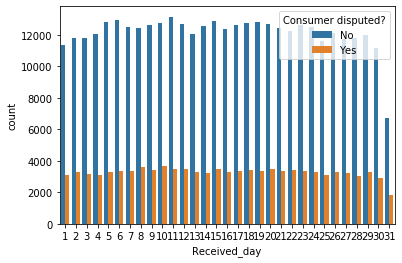

In [73]:
ax=sns.countplot(x='Received_day',hue='Consumer disputed?',data=Data)

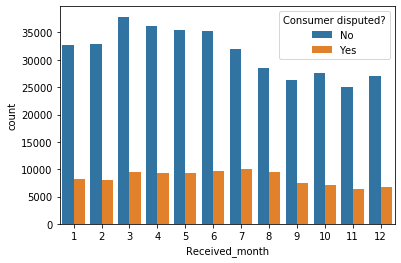

In [74]:
ax=sns.countplot(x='Received_month',hue='Consumer disputed?',data=Data)

In [75]:
Data["ZIP code"]=Data['ZIP code'].fillna(0)

In [76]:
Data["State"]=Data['State'].fillna(0)

In [77]:
Data

,Sub-product,Issue,Company,State,ZIP code,Timely response?,Consumer disputed?,Received_day,Received_month,Received_year,Product_Mortage,Product_Debt_col,Product_Credit_report,Product_Credit_card,Product_Bank_acc,Product_Consumer_Loan,Product_Money_tran,Product_Payday_loan,Product_Prepaid_card,Product_Others,Product_Student_loan,Submitted_Web,Submitted_Ref,Submitted_Phone,Submitted_Postal,Submitted_Fax,Sent_day,Sent_month,Sent_year
0,199995,1735,35453,12377.0,21.0,1,No,15,5,2014,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,16,5,2014
1,2373,4618,1633,17109.0,50.0,1,No,18,9,2014,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,24,9,2014
2,199995,58527,28832,70001.0,13.0,1,No,13,3,2014,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,3,4,2014
3,199995,1735,8201,21258.0,158.0,1,No,17,7,2015,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,17,7,2015
4,199995,1624,46336,9584.0,50.0,1,No,20,11,2014,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,28,11,2014
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
478416,38310,7758,28852,35895.0,46.0,1,No,30,6,2015,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,7,2015
478417,199995,805,22300,4950.0,16.0,1,No,20,6,2013,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,21,6,2013
478418,199995,58527,28832,35895.0,4.0,1,No,9,9,2014,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,9,9,2014
478419,48028,80302,3731,70001.0,80.0,1,No,21,9,2012,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,24,9,2012


In [78]:
Data.isnull().sum()

Sub-product              0
Issue                    0
Company                  0
State                    0
ZIP code                 0
Timely response?         0
Consumer disputed?       0
Received_day             0
Received_month           0
Received_year            0
Product_Mortage          0
Product_Debt_col         0
Product_Credit_report    0
Product_Credit_card      0
Product_Bank_acc         0
Product_Consumer_Loan    0
Product_Money_tran       0
Product_Payday_loan      0
Product_Prepaid_card     0
Product_Others           0
Product_Student_loan     0
Submitted_Web            0
Submitted_Ref            0
Submitted_Phone          0
Submitted_Postal         0
Submitted_Fax            0
Sent_day                 0
Sent_month               0
Sent_year                0
dtype: int64

In [79]:
train, test = train_test_split(Data, test_size = 0.2,random_state=2)

In [80]:
x_train=train.drop(["Consumer disputed?"],1)
y_train=train["Consumer disputed?"]
x_test=test.drop(["Consumer disputed?"],1)
y_test=test["Consumer disputed?"]

In [81]:
pd.set_option('display.max_rows', None)

In [82]:
y_train

226990     No
316207    Yes
142207     No
6823       No
299194     No
370150    Yes
238649     No
416826     No
39806     Yes
99119     Yes
371896     No
167227     No
303937    Yes
252461     No
203768     No
180046     No
301685     No
158853     No
353456     No
122689     No
436462     No
195788     No
244272     No
401674     No
214118     No
121651    Yes
115284     No
157313     No
114237     No
295157     No
25122     Yes
66418      No
425363     No
23205      No
175491     No
138289     No
105437     No
127596     No
150581     No
294928     No
200378     No
230335     No
103699     No
331584     No
464258     No
389305     No
387474     No
301039     No
437749     No
346647     No
335063     No
387548     No
286522    Yes
329679     No
174835     No
203600     No
155784     No
55818      No
205182     No
382588     No
415344     No
72576     Yes
360566     No
345070     No
149169     No
395603     No
324140     No
60031     Yes
405127     No
189809     No
71960      No
342324

In [89]:
data_corr = Data.corr()

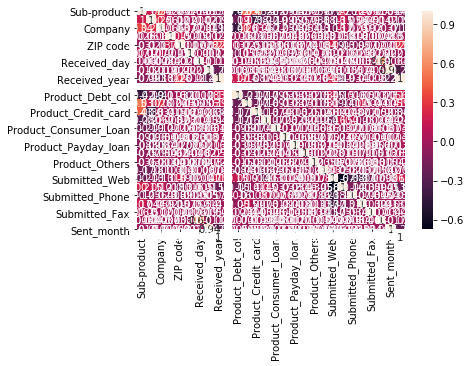

In [90]:
sns.heatmap(data_corr,annot=True)

## Logistic Regression Maodel

In [91]:
#Define model
logreg=LogisticRegression()

#Fit model
logreg.fit(x_train,y_train) #order is important here. (independent, dependent)

C:\Users\somya\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [92]:
logr=LogisticRegression(penalty="l1",class_weight="balanced",random_state=2)

In [93]:
logr.fit(x_train,y_train)

C:\Users\somya\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l1',
                   random_state=2, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [94]:
#Prediction with test value

logreg_prediction=logreg.predict(x_test)
#logreg_prediction
logreg_score=accuracy_score(y_test,logreg_prediction)
print(logreg_score)

0.7897371583842817


In [95]:
#Prediction with train value

logreg_prediction=logreg.predict(x_train)
#logreg_prediction
logreg_score=accuracy_score(y_train,logreg_prediction)
print(logreg_score)

0.7875506876802809


## Desicion Tree

In [96]:
from sklearn.tree import DecisionTreeClassifier

In [97]:
#Define Model
dt=DecisionTreeClassifier(random_state=1)

In [98]:
#fit model
dt.fit(x_train, y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=1, splitter='best')

In [99]:
#Prediction with test value

dt_prediction=dt.predict(x_test)
#dt_prediction
dt_score=accuracy_score(y_test,dt_prediction)
dt_score

0.6771907822542719

In [100]:
#Prediction with train value

dt_prediction=dt.predict(x_train)
#dt_prediction
dt_score=accuracy_score(y_train,dt_prediction)
dt_score

0.999229233727687

## Random Forest

In [101]:
#Define Model
rfc=RandomForestClassifier()

#fit the best algorithm 
rfc.fit(x_train,y_train)

C:\Users\somya\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [102]:
#Prediction with test value

rf_prediction=rfc.predict(x_test)
#rf_prediction
rf_score=accuracy_score(y_test,rf_prediction)
print(rf_score)

0.7839682290850185


In [103]:
#Prediction with train value

rf_prediction=rfc.predict(x_train)
#rf_prediction
rf_score=accuracy_score(y_train,rf_prediction)
print(rf_score)

0.9744680406337528


## XgBoost

In [105]:
#Define model
xgboost=xgb.XGBClassifier(max_depth=3,n_estimators=300,learning_rate=0.05)

#Fit model
xgboost.fit(x_train,y_train)

XGBClassifier(base_score=0.5, booster=None, colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints=None,
              learning_rate=0.05, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=nan, monotone_constraints=None,
              n_estimators=300, n_jobs=0, num_parallel_tree=1,
              objective='binary:logistic', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method=None,
              validate_parameters=False, verbosity=None)

In [106]:
#Prediction with test value

xgboost_prediction=xgboost.predict(x_test)
#rf_prediction
xgboost_score=accuracy_score(y_test,xgboost_prediction)
print(xgboost_score)

0.795704655902179


In [107]:
#Prediction with train value

xgboost_prediction=xgboost.predict(x_train)
#rf_prediction
xgboost_score=accuracy_score(y_train,xgboost_prediction)
print(xgboost_score)

0.7932360687262239
